In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
# Load dataset
df = pd.read_csv('/content/zomato_dataset.csv')

In [ ]:
# Overview
print("Dataset shape:", df.shape)
df.head()

Dataset shape: (123657, 12)


,Restaurant Name,Dining Rating,Delivery Rating,Dining Votes,Delivery Votes,Cuisine,Place Name,City,Item Name,Best Seller,Votes,Prices
0,Doner King,3.9,4.2,39,0,Fast Food,Malakpet,Hyderabad,Platter Kebab Combo,BESTSELLER,84,249.0
1,Doner King,3.9,4.2,39,0,Fast Food,Malakpet,Hyderabad,Chicken Rumali Shawarma,BESTSELLER,45,129.0
2,Doner King,3.9,4.2,39,0,Fast Food,Malakpet,Hyderabad,Chicken Tandoori Salad,NaN,39,189.0
3,Doner King,3.9,4.2,39,0,Fast Food,Malakpet,Hyderabad,Chicken BBQ Salad,BESTSELLER,43,189.0
4,Doner King,3.9,4.2,39,0,Fast Food,Malakpet,Hyderabad,Special Doner Wrap Combo,MUST TRY,31,205.0


In [ ]:
# Strip column names of spaces
df.columns = df.columns.str.strip()

In [ ]:
# Rename columns for consistency
df.rename(columns={
    'Dining Rating': 'Dining_Rating',
    'Delivery Rating': 'Delivery_Rating',
    'Dining Votes': 'Dining_Votes',
    'Delivery Votes': 'Delivery_Votes',
    'Cuisine ': 'Cuisine',
    'Place Name': 'Place',
    'Item Name': 'Item',
    'Best Seller': 'Best_Seller'
}, inplace=True)

In [ ]:
# Drop rows with too many missing values
df.dropna(thresh=5, inplace=True)


In [ ]:
# Fill NA values with 0 or 'Unknown'
df.fillna({
    'Dining_Rating': 0,
    'Delivery_Rating': 0,
    'Dining_Votes': 0,
    'Delivery_Votes': 0,
    'Votes': 0,
    'Prices': df['Prices'].median(),
    'Cuisine': 'Unknown',
    'Best_Seller': 'Unknown'
}, inplace=True)

In [ ]:
df.head()

,Restaurant Name,Dining_Rating,Delivery_Rating,Dining_Votes,Delivery_Votes,Cuisine,Place,City,Item,Best_Seller,Votes,Prices
0,Doner King,3.9,4.2,39,0,Fast Food,Malakpet,Hyderabad,Platter Kebab Combo,BESTSELLER,84,249.0
1,Doner King,3.9,4.2,39,0,Fast Food,Malakpet,Hyderabad,Chicken Rumali Shawarma,BESTSELLER,45,129.0
2,Doner King,3.9,4.2,39,0,Fast Food,Malakpet,Hyderabad,Chicken Tandoori Salad,Unknown,39,189.0
3,Doner King,3.9,4.2,39,0,Fast Food,Malakpet,Hyderabad,Chicken BBQ Salad,BESTSELLER,43,189.0
4,Doner King,3.9,4.2,39,0,Fast Food,Malakpet,Hyderabad,Special Doner Wrap Combo,MUST TRY,31,205.0


In [ ]:
# Simulate entry/exit: Group by restaurant name and place
df['Total_Rating'] = df[['Dining_Rating', 'Delivery_Rating']].mean(axis=1)
df['Total_Votes'] = df[['Dining_Votes', 'Delivery_Votes', 'Votes']].sum(axis=1)

In [ ]:
# Classify based on popularity
df['Popularity_Score'] = df['Total_Rating'] * np.log1p(df['Total_Votes'])

In [ ]:
# Fix: Use duplicates='drop' to handle identical popularity scores
def assign_entry_exit_label(group):
    try:
        return pd.qcut(group, q=3, labels=['Exit', 'Stable', 'Entry'], duplicates='drop')
    except ValueError:
        # fallback: assign all as 'Stable' if binning fails
        return pd.Series(['Stable'] * len(group), index=group.index)

df['Entry_Exit_Label'] = df.groupby('City')['Popularity_Score'].transform(assign_entry_exit_label)


In [ ]:
# Save original names for visualization
df['City_Name'] = df['City']
df['Cuisine_Name'] = df['Cuisine']
df['Place_Name'] = df['Place']


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Encode place, cuisine, city
for col in ['City', 'Place', 'Cuisine']:
    df[col] = LabelEncoder().fit_transform(df[col])


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
# Features and target
X = df[['City', 'Place', 'Cuisine', 'Prices', 'Total_Rating', 'Total_Votes']]
y = df['Entry_Exit_Label']

In [ ]:
# Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [ ]:
# Model
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)


RandomForestClassifier(random_state=42)

In [ ]:
# Evaluation
y_pred = model.predict(X_test)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[7966    0    9]
 [   0 8110    2]
 [   3   10 8632]]
              precision    recall  f1-score   support

       Entry       1.00      1.00      1.00      7975
        Exit       1.00      1.00      1.00      8112
      Stable       1.00      1.00      1.00      8645

    accuracy                           1.00     24732
   macro avg       1.00      1.00      1.00     24732
weighted avg       1.00      1.00      1.00     24732



In [ ]:
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import random
import warnings
warnings.filterwarnings("ignore")

In [ ]:
def generate_simulation(cities, n_max=10, steps=50):
    """
    Simulates firm dynamics across multiple cities for Entry, Exit, and Stay.
    """
    sim_data = []

    for city in cities:
        current_firms = random.randint(1, n_max - 1)

        for step in range(steps):
            # Probabilities based on current saturation
            enter_prob = max(0, 1 - current_firms / n_max)
            exit_prob = max(0, current_firms / n_max)
            stay_prob = 1 - (enter_prob + exit_prob) / 2

            # Normalize to sum to 1
            total = enter_prob + stay_prob + exit_prob
            enter_prob /= total
            stay_prob /= total
            exit_prob /= total

            action = np.random.choice(['enter', 'stay', 'exit'], p=[enter_prob, stay_prob, exit_prob])

            if action == 'enter' and current_firms < n_max:
                current_firms += 1
            elif action == 'exit' and current_firms > 0:
                current_firms -= 1

            sim_data.append({
                'City': city,
                'Step': step,
                'Firms': current_firms,
                'Enter_Prob': enter_prob,
                'Stay_Prob': stay_prob,
                'Exit_Prob': exit_prob,
                'Action': action
            })

    return pd.DataFrame(sim_data)

# Cities to simulate
cities = ['Delhi', 'Mumbai', 'Bangalore', 'Chennai', 'Hyderabad']
sim_df = generate_simulation(cities, n_max=10, steps=50)
sim_df.head()


,City,Step,Firms,Enter_Prob,Stay_Prob,Exit_Prob,Action
0,Delhi,0,9,0.066667,0.333333,0.600000,stay
1,Delhi,1,8,0.066667,0.333333,0.600000,exit
2,Delhi,2,7,0.133333,0.333333,0.533333,exit
3,Delhi,3,8,0.200000,0.333333,0.466667,enter
4,Delhi,4,7,0.133333,0.333333,0.533333,exit


In [ ]:
# Convert categorical actions to numeric labels
action_mapping = {'enter': 0, 'stay': 1, 'exit': 2}
sim_df['Action_Label'] = sim_df['Action'].map(action_mapping)

# Define features and label
features = ['Firms', 'Enter_Prob', 'Stay_Prob', 'Exit_Prob']
X = sim_df[features]
y = sim_df['Action_Label']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
svm_model = SVC(kernel='rbf', probability=True, random_state=42)
svm_model.fit(X_train, y_train)
svm_preds = svm_model.predict(X_test)

print("📊 SVM Classification Report:")
print(classification_report(y_test, svm_preds, target_names=action_mapping.keys()))


📊 SVM Classification Report:
              precision    recall  f1-score   support

       enter       0.47      0.56      0.51        16
        stay       0.35      0.39      0.37        18
        exit       0.27      0.19      0.22        16

    accuracy                           0.38        50
   macro avg       0.37      0.38      0.37        50
weighted avg       0.36      0.38      0.37        50



In [ ]:
gb_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
gb_model.fit(X_train, y_train)
gb_preds = gb_model.predict(X_test)

print("📊 Gradient Boosting Classification Report:")
print(classification_report(y_test, gb_preds, target_names=action_mapping.keys()))


📊 Gradient Boosting Classification Report:
              precision    recall  f1-score   support

       enter       1.00      1.00      1.00        16
        stay       1.00      1.00      1.00        18
        exit       1.00      1.00      1.00        16

    accuracy                           1.00        50
   macro avg       1.00      1.00      1.00        50
weighted avg       1.00      1.00      1.00        50



In [ ]:
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test)

print("📊 XGBoost Classification Report:")
print(classification_report(y_test, xgb_preds, target_names=action_mapping.keys()))


📊 XGBoost Classification Report:
              precision    recall  f1-score   support

       enter       1.00      1.00      1.00        16
        stay       1.00      1.00      1.00        18
        exit       1.00      1.00      1.00        16

    accuracy                           1.00        50
   macro avg       1.00      1.00      1.00        50
weighted avg       1.00      1.00      1.00        50



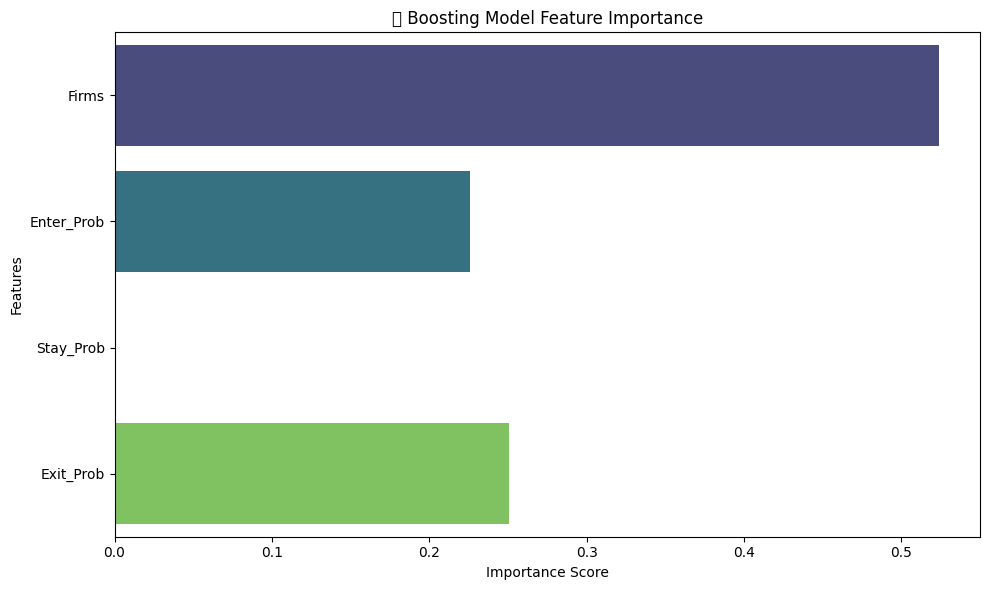

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assign either gb_model or xgb_model to boost_model
boost_model = gb_model  # or boost_model = xgb_model

# Now you can access feature importances:
importances = boost_model.feature_importances_
feature_names = X.columns  # Your training features

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=importances, y=feature_names, palette="viridis")
plt.title("🌟 Boosting Model Feature Importance")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.tight_layout()
plt.show()

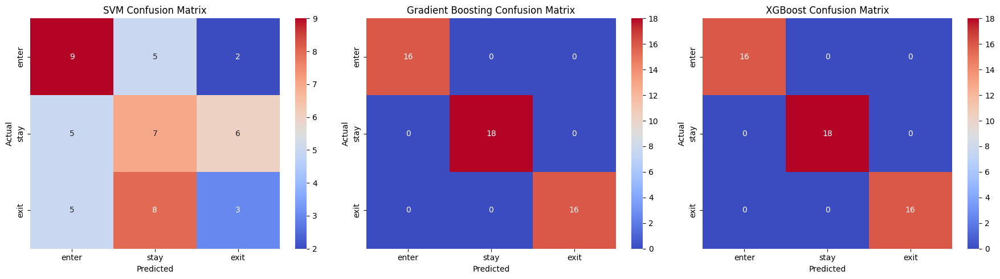

In [ ]:
models = {
    "SVM": svm_preds,
    "Gradient Boosting": gb_preds,
    "XGBoost": xgb_preds
}

plt.figure(figsize=(18, 5))
for idx, (name, preds) in enumerate(models.items()):
    plt.subplot(1, 3, idx + 1)
    cm = confusion_matrix(y_test, preds)
    sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm',
                xticklabels=action_mapping.keys(),
                yticklabels=action_mapping.keys())
    plt.title(f"{name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")

plt.tight_layout()
plt.show()


In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree

# Train the decision tree
tree_model = DecisionTreeClassifier(max_depth=4, random_state=42)
tree_model.fit(X_train, y_train)

# Predictions
tree_preds = tree_model.predict(X_test)

# Classification report
print("📊 Decision Tree Classification Report:")
print(classification_report(y_test, tree_preds, target_names=action_mapping.keys()))


📊 Decision Tree Classification Report:
              precision    recall  f1-score   support

       enter       0.94      0.94      0.94        16
        stay       1.00      0.50      0.67        18
        exit       0.64      1.00      0.78        16

    accuracy                           0.80        50
   macro avg       0.86      0.81      0.79        50
weighted avg       0.86      0.80      0.79        50



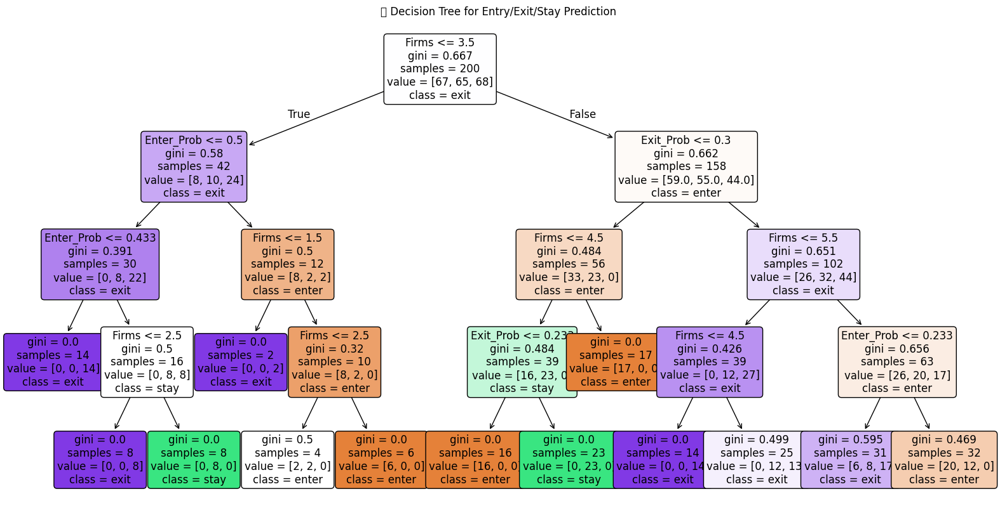

In [ ]:
plt.figure(figsize=(20, 10))
plot_tree(tree_model,
          feature_names=features,
          class_names=['enter', 'stay', 'exit'],
          filled=True,
          rounded=True,
          fontsize=12)
plt.title("🌳 Decision Tree for Entry/Exit/Stay Prediction")
plt.show()


In [ ]:
import plotly.express as px

# Group by City and Entry/Exit label
city_group = df.groupby(['City_Name', 'Entry_Exit_Label']).agg({
    'Restaurant Name': 'count',
    'Total_Votes': 'sum',
    'Popularity_Score': 'mean'
}).reset_index().rename(columns={'Restaurant Name': 'Restaurant_Count'})

# Bubble Chart
fig = px.scatter(
    city_group,
    x='City_Name',
    y='Restaurant_Count',
    size='Total_Votes',
    color='Entry_Exit_Label',
    hover_name='City_Name',
    title='📊 Entry/Exit Distribution of Restaurants by City',
    labels={'Restaurant_Count': 'Number of Restaurants'},
    size_max=60
)
fig.update_layout(xaxis_tickangle=45)
fig.show()


In [ ]:
fig = px.parallel_categories(
    df[['Cuisine_Name', 'City_Name', 'Entry_Exit_Label']],
    color=df['Popularity_Score'],
    color_continuous_scale=px.colors.sequential.Inferno,
    title="Cuisine → City → Entry/Exit Pattern"
)
fig.show()


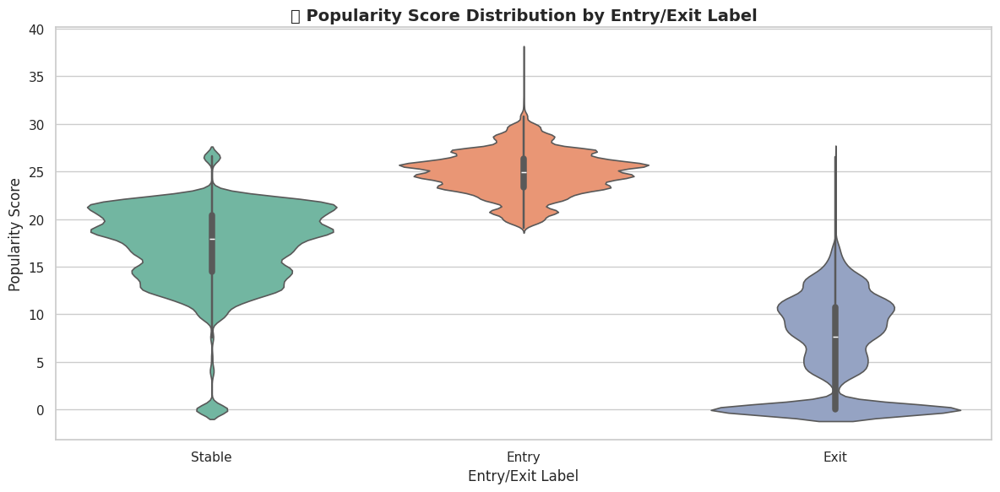

In [ ]:
# Set figure aesthetics
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")

# Advanced violin plot
sns.violinplot(
    x='Entry_Exit_Label',
    y='Popularity_Score',
    data=df,
    inner='box',  # Show inner boxplot inside violins
    palette='Set2',  # Distinct, aesthetic color scheme
    linewidth=1.2
)

# Title and labels
plt.title('🎻 Popularity Score Distribution by Entry/Exit Label', fontsize=14, fontweight='bold')
plt.xlabel('Entry/Exit Label', fontsize=12)
plt.ylabel('Popularity Score', fontsize=12)

# Enhance layout
plt.tight_layout()
plt.show()

In [ ]:
top_10 = df[['Restaurant Name', 'Popularity_Score']].sort_values(by='Popularity_Score', ascending=False).head(10)

fig = px.bar_polar(
    top_10,
    r='Popularity_Score',
    theta='Restaurant Name',
    color='Restaurant Name',
    title='Top 3 Restaurants by Popularity Score',
    template='plotly_dark'
)
fig.show()


In [ ]:
# Filter out rows with zero or missing Total_Votes
treemap_df = df[df['Total_Votes'] > 0]


In [ ]:
import plotly.express as px

fig = px.treemap(
    treemap_df,
    path=['Entry_Exit_Label', 'City_Name', 'Cuisine_Name'],
    values='Total_Votes',
    color='Popularity_Score',
    color_continuous_scale='Viridis',
    title='🌳 Treemap of Entry/Exit Restaurants by City and Cuisine (Weighted by Total Votes)'
)
fig.show()


In [ ]:
import plotly.express as px

# Step 1: Filter out rows where Popularity_Score is zero or missing
sunburst_df = df[df['Popularity_Score'] > 0].copy()

# Step 2: Sunburst Chart
fig = px.sunburst(
    sunburst_df,
    path=['Entry_Exit_Label', 'City_Name', 'Cuisine_Name'],
    values='Popularity_Score',
    color='Popularity_Score',
    color_continuous_scale='Plasma',
    title='☀️ Sunburst of Entry/Exit by City and Cuisine (Based on Popularity Score)'
)
fig.show()


In [ ]:
fig = px.scatter_3d(
    df,
    x='Prices', y='Total_Votes', z='Popularity_Score',
    color='Entry_Exit_Label',
    symbol='Cuisine_Name',
    title='3D Visualization of Restaurant Metrics'
)
fig.show()


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

# Load dataset
df = pd.read_csv('/content/zomato_dataset.csv')
df.columns = df.columns.str.strip()

# Popularity proxy = Total Votes
def label_status(votes):
    if votes >= 500:
        return 'Stay'
    elif votes >= 100:
        return 'Entry'
    else:
        return 'Exit'

df['Status'] = df['Votes'].apply(label_status)

# Encode city and status
df = df.dropna(subset=['Votes', 'Prices', 'Dining Rating', 'City'])
le_city = LabelEncoder()
df['City_Code'] = le_city.fit_transform(df['City'])

le_status = LabelEncoder()
df['Status_Code'] = le_status.fit_transform(df['Status'])

# Select features: City, Dining Rating, Votes
X = df[['City_Code', 'Dining Rating', 'Votes']]
y = df['Status_Code']

# Normalize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-Test
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)


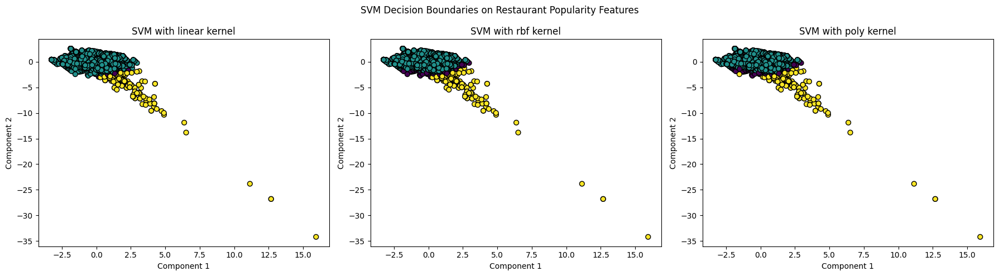

In [ ]:
from sklearn.svm import SVC
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Reduce dimensions to 2D for visualization
pca = PCA(n_components=2)
X_train_2d = pca.fit_transform(X_train)
X_test_2d = pca.transform(X_test)

kernels = ['linear', 'rbf', 'poly']
plt.figure(figsize=(18, 5))

for i, kernel in enumerate(kernels):
    model = SVC(kernel=kernel, gamma='scale')
    model.fit(X_train_2d, y_train)
    plt.subplot(1, 3, i+1)
    plt.scatter(X_test_2d[:, 0], X_test_2d[:, 1], c=model.predict(X_test_2d), cmap='viridis', s=40, edgecolors='k')
    plt.title(f'SVM with {kernel} kernel')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')

plt.suptitle("SVM Decision Boundaries on Restaurant Popularity Features")
plt.tight_layout()
plt.show()


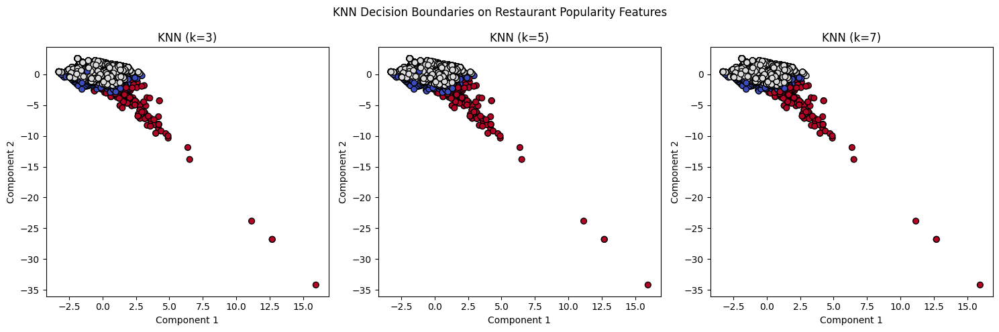

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

plt.figure(figsize=(15, 5))
neighbors_list = [3, 5, 7]

for i, k in enumerate(neighbors_list):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_2d, y_train)
    plt.subplot(1, 3, i+1)
    plt.scatter(X_test_2d[:, 0], X_test_2d[:, 1], c=knn.predict(X_test_2d), cmap='coolwarm', s=40, edgecolors='k')
    plt.title(f'KNN (k={k})')
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')

plt.suptitle("KNN Decision Boundaries on Restaurant Popularity Features")
plt.tight_layout()
plt.show()


In [ ]:
print("Status Classes:", dict(zip(le_status.transform(le_status.classes_), le_status.classes_)))
print("City Codes Sample:", dict(zip(df['City_Code'].head(5), df['City'].head(5))))


Status Classes: {np.int64(0): 'Entry', np.int64(1): 'Exit', np.int64(2): 'Stay'}
City Codes Sample: {5: ' Hyderabad'}


In [ ]:
# Define the function for status labeling
def get_status(votes):
    if votes >= 20:
        return 'Stay'
    elif votes >= 1:
        return 'Entry'
    else:
        return 'Exit'


In [ ]:
# Add Status_Label to the DataFrame
df_status = df.copy()
df_status['Votes'] = pd.to_numeric(df_status['Votes'], errors='coerce')
df_status = df_status.dropna(subset=['Votes', 'City'])
df_status['Status_Label'] = df_status['Votes'].apply(get_status)

# Top 10 cities by number of restaurants
top_cities = df_status['City'].value_counts().nlargest(10).index
df_top = df_status[df_status['City'].isin(top_cities)]

# Group and calculate probabilities
prob_table = (
    df_top.groupby(['City', 'Status_Label'])
    .size()
    .unstack(fill_value=0)
)

# Convert counts to probability
prob_table = prob_table.div(prob_table.sum(axis=1), axis=0)

# Sort table by highest 'Stay' probability
prob_table = prob_table.sort_values(by='Stay', ascending=False)

print("🧾 Probability Table for Entry, Exit, Stay - Top 10 Cities:")
display(prob_table.style.background_gradient(cmap='Blues'))


🧾 Probability Table for Entry, Exit, Stay - Top 10 Cities:


Status_Label,Entry,Exit,Stay
City,,,
Hyderabad,0.453489,0.491128,0.055383
Jaipur,0.489143,0.470637,0.040220
Kolkata,0.494517,0.469028,0.036455
Lucknow,0.481340,0.487277,0.031383
Bangalore,0.501196,0.475681,0.023123
Ahmedabad,0.390310,0.590559,0.019131
Chennai,0.384437,0.599352,0.016211
Pune,0.393594,0.591382,0.015024
Kochi,0.495775,0.492688,0.011537


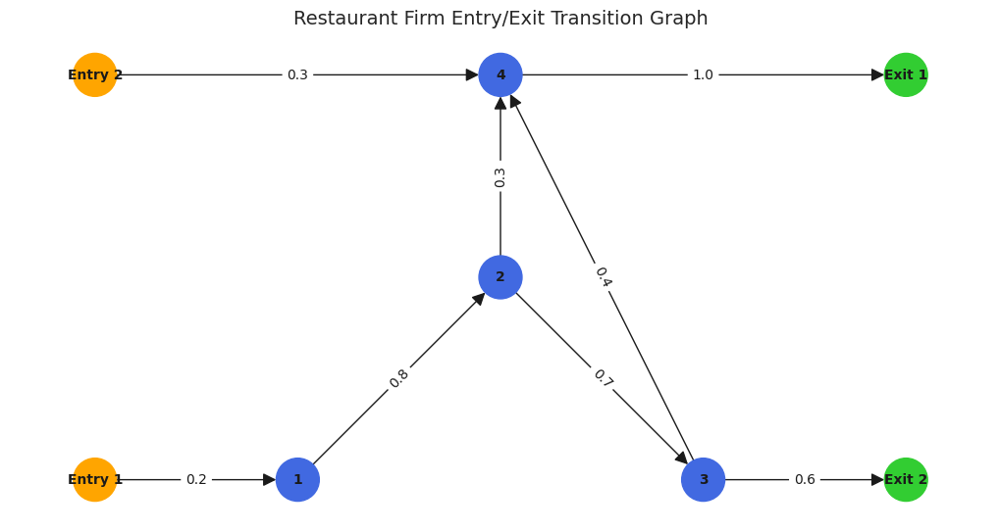

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a directed graph
G = nx.DiGraph()

# Define node positions manually (x, y) for better layout
pos = {
    'Entry 1': (-2, 0), 'Entry 2': (-2, 2),
    1: (-1, 0), 2: (0, 1), 3: (1, 0), 4: (0, 2),
    'Exit 1': (2, 2), 'Exit 2': (2, 0)
}

# Add edges with probabilities (weights)
edges = [
    ('Entry 1', 1, 0.2), ('Entry 2', 4, 0.3),
    (1, 2, 0.8), (2, 3, 0.7), (2, 4, 0.3),
    (3, 4, 0.4), (3, 'Exit 2', 0.6),
    (4, 'Exit 1', 1.0)
]

# Add nodes and edges
for u, v, w in edges:
    G.add_edge(u, v, weight=w)

# Draw nodes
node_colors = []
for node in G.nodes():
    if str(node).startswith("Entry"):
        node_colors.append("orange")
    elif str(node).startswith("Exit"):
        node_colors.append("limegreen")
    else:
        node_colors.append("royalblue")

# Draw the graph
plt.figure(figsize=(10, 5))
nx.draw(
    G, pos, with_labels=True, node_color=node_colors,
    node_size=1000, arrowsize=20, font_size=10, font_weight='bold'
)

# Draw edge labels (transition probabilities)
edge_labels = nx.get_edge_attributes(G, 'weight')
edge_labels = {k: f"{v:.1f}" for k, v in edge_labels.items()}
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=10)

plt.title("Restaurant Firm Entry/Exit Transition Graph", fontsize=14)
plt.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np

def profit(n, base_revenue=100, competition_penalty=5, fixed_cost=40):
    """
    Calculates profit based on number of competing firms.
    """
    revenue = base_revenue - competition_penalty * n
    return revenue - fixed_cost

def utilities(n, entry_cost=20, exit_cost=10):
    """
    Utility for three choices: enter, stay, exit
    """
    pi = profit(n)
    return {
        'enter': pi - entry_cost,
        'stay': pi,
        'exit': -exit_cost
    }

def softmax_utilities(utils, beta=1.0):
    """
    Logit choice probabilities from utility values.
    """
    u = np.array(list(utils.values()))
    e_u = np.exp(beta * (u - np.max(u)))  # Stability fix
    probs = e_u / e_u.sum()
    return dict(zip(utils.keys(), probs))


In [ ]:
def value_function_iteration(
    n_max=10, discount=0.95, iterations=1000, tolerance=1e-6
):
    """
    Value function iteration for the firm to decide optimal policy.
    """

    V = np.zeros(n_max + 1)  # value for each market state (0 to n_max firms)

    for it in range(iterations):
        V_new = np.copy(V)
        for n in range(n_max + 1):
            pi = profit(n)
            # Bellman update: value = flow profit + discounted expected value
            # Assume transition is n -> n +/- 1
            expected_future = 0.5 * V[min(n + 1, n_max)] + 0.5 * V[max(n - 1, 0)]
            V_new[n] = pi + discount * expected_future

        if np.max(np.abs(V_new - V)) < tolerance:
            break
        V = V_new

    return V


In [ ]:
def bellman_operator(V, n, discount=0.95):
    """
    Computes value for each action at state n using Bellman principle.
    """
    actions = ['enter', 'stay', 'exit']
    next_states = {
        'enter': min(n + 1, len(V) - 1),
        'stay': n,
        'exit': max(n - 1, 0)
    }

    utilities_dict = utilities(n)
    values = {}

    for a in actions:
        expected_V = V[next_states[a]]
        values[a] = utilities_dict[a] + discount * expected_V

    best_action = max(values, key=values.get)
    return values, best_action


In [ ]:
def entry_exit_logit_with_value(V, n, discount=0.95, beta=1.0):
    """
    Uses VFI values in logit function to predict firm behavior.
    """
    actions = ['enter', 'stay', 'exit']
    next_states = {
        'enter': min(n + 1, len(V) - 1),
        'stay': n,
        'exit': max(n - 1, 0)
    }

    utils = utilities(n)
    long_run_utils = {}

    for a in actions:
        expected_V = V[next_states[a]]
        long_run_utils[a] = utils[a] + discount * expected_V

    return softmax_utilities(long_run_utils, beta=beta)


In [ ]:
def profit_advanced(n, city_params):
    """
    Computes profit for a city with specific features.
    """
    demand = city_params['demand']
    competition_penalty = city_params['competition_penalty']
    fixed_cost = city_params['fixed_cost']

    revenue = demand - competition_penalty * n
    return revenue - fixed_cost


In [ ]:
city_params = {
    "demand": 120,
    "competition_penalty": 6,
    "fixed_cost": 45
}


In [ ]:
V = value_function_iteration()
n = 5  # say there are 5 firms
logit_probs = entry_exit_logit_with_value(V, n)

print(f"Probabilities at n={n}: {logit_probs}")


Probabilities at n=5: {'enter': np.float64(6.947460194387794e-45), 'stay': np.float64(1.0851348041445167e-08), 'exit': np.float64(0.9999999891486518)}


In [ ]:
import numpy as np
import pandas as pd

In [ ]:
cities = {
    'Delhi':     {'demand': 1000, 'competition_penalty': 8, 'fixed_cost': 100, 'entry_cost': 50},
    'Mumbai':    {'demand': 950,  'competition_penalty': 7, 'fixed_cost': 90,  'entry_cost': 45},
    'Bangalore': {'demand': 900,  'competition_penalty': 6, 'fixed_cost': 85,  'entry_cost': 40},
    'Jaipur':    {'demand': 850,  'competition_penalty': 5, 'fixed_cost': 80,  'entry_cost': 35},
}

In [ ]:
# Value iteration function
def value_iteration_city(params, n_max=10, beta=0.95, tol=1e-5):
    V = np.zeros(n_max + 1)
    while True:
        V_new = np.zeros_like(V)
        for n in range(n_max + 1):
            profit = (params['demand'] / (n + 1)) - (params['competition_penalty'] * n) - params['fixed_cost']
            value_enter = profit - params['entry_cost'] + beta * V[min(n + 1, n_max)]
            value_stay = profit + beta * V[n]
            value_exit = 0
            V_new[n] = max(value_enter, value_stay, value_exit)
        if np.max(np.abs(V_new - V)) < tol:
            break
        V = V_new
    return V

In [ ]:
def entry_exit_probs(V, n, params, beta=0.95, epsilon=1e-6):
    profit = (params['demand'] / (n + 1)) - (params['competition_penalty'] * n) - params['fixed_cost']

    # Add incentive to entry (for experimentation)
    entry_bonus = 15 if n == 0 else 0

    value_enter = profit - params['entry_cost'] + beta * V[min(n + 1, len(V) - 1)] + entry_bonus
    value_stay = profit + beta * V[n]
    value_exit = 0

    values = np.array([value_enter, value_stay, value_exit])

    # Normalize to avoid extreme softmax results
    values = (values - np.mean(values)) / (np.std(values) + 1e-6)

    exp_values = np.exp(values - np.max(values))
    probs = exp_values / np.sum(exp_values)

    # Clip small values to avoid exact 0
    probs = np.clip(probs, epsilon, 1.0)
    probs /= probs.sum()  # Renormalize

    return {'enter': probs[0], 'stay': probs[1], 'exit': probs[2]}

In [ ]:
# Run the simulation
def generate_simulation_data(cities, max_firms=10):
    data = []
    for city, params in cities.items():
        V = value_iteration_city(params, n_max=max_firms)
        for n in range(max_firms + 1):
            probs = entry_exit_probs(V, n, params)
            data.append({
                'City': city,
                'Firms': n,
                # Rename columns to match the plotting function:
                'P(Enter)': round(probs['enter'], 3),
                'P(Stay)': round(probs['stay'], 3),
                'P(Exit)': round(probs['exit'], 3)
            })
    return pd.DataFrame(data)

# Generate DataFrame and assign it to df_probs:
df_probs = generate_simulation_data(cities, max_firms=10)

In [ ]:
# Generate DataFrame and assign it to df_sim:
df_sim = generate_simulation_data(cities, max_firms=10)  # Assign the DataFrame to df_sim

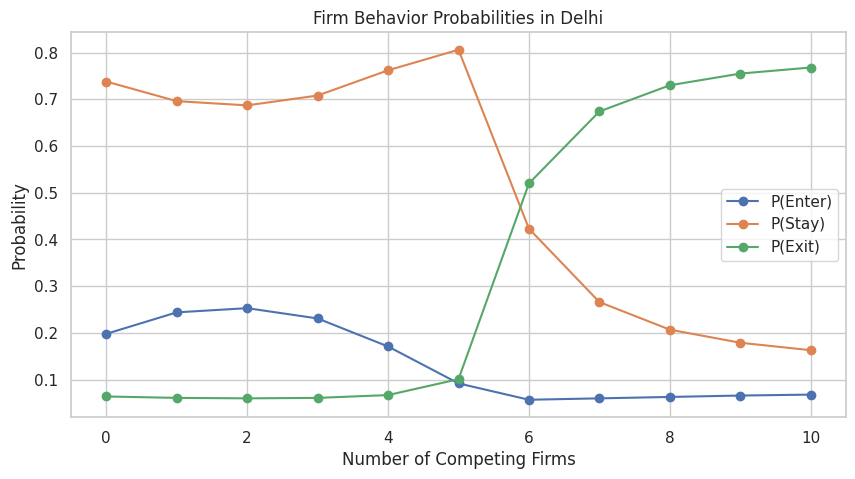

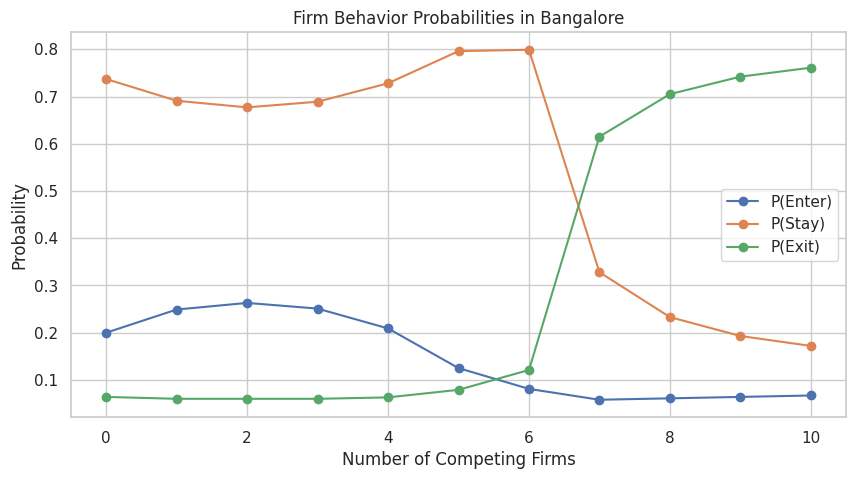

In [ ]:
# Define the plotting function here
import seaborn as sns
import matplotlib.pyplot as plt

def plot_city_probabilities(df, city):
    subset = df[df['City'] == city]
    plt.figure(figsize=(10, 5))
    plt.plot(subset['Firms'], subset['P(Enter)'], label='P(Enter)', marker='o')
    plt.plot(subset['Firms'], subset['P(Stay)'], label='P(Stay)', marker='o')
    plt.plot(subset['Firms'], subset['P(Exit)'], label='P(Exit)', marker='o')
    plt.title(f'Firm Behavior Probabilities in {city}')
    plt.xlabel('Number of Competing Firms')
    plt.ylabel('Probability')
    plt.legend()
    plt.grid(True)
    plt.show()

#Now call the plotting function:
plot_city_probabilities(df_probs, 'Delhi')
plot_city_probabilities(df_probs, 'Bangalore')

In [ ]:
# Display simulation output
print(df_sim.head(40))  # View top 40 rows

         City  Firms  P(Enter)  P(Stay)  P(Exit)
0       Delhi      0     0.198    0.738    0.064
1       Delhi      1     0.244    0.696    0.061
2       Delhi      2     0.253    0.687    0.060
3       Delhi      3     0.231    0.708    0.061
4       Delhi      4     0.171    0.762    0.067
5       Delhi      5     0.092    0.806    0.101
6       Delhi      6     0.057    0.423    0.520
7       Delhi      7     0.060    0.266    0.674
8       Delhi      8     0.063    0.207    0.730
9       Delhi      9     0.066    0.179    0.755
10      Delhi     10     0.068    0.163    0.768
11     Mumbai      0     0.199    0.737    0.064
12     Mumbai      1     0.248    0.692    0.060
13     Mumbai      2     0.260    0.680    0.060
14     Mumbai      3     0.245    0.695    0.060
15     Mumbai      4     0.197    0.739    0.064
16     Mumbai      5     0.107    0.805    0.088
17     Mumbai      6     0.069    0.769    0.163
18     Mumbai      7     0.058    0.304    0.638
19     Mumbai      8

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_city_probabilities(df, city):
    subset = df[df['City'] == city]
    plt.figure(figsize=(10, 5))
    plt.plot(subset['Firms'], subset['P(Enter)'], label='P(Enter)', marker='o')
    plt.plot(subset['Firms'], subset['P(Stay)'], label='P(Stay)', marker='o')
    plt.plot(subset['Firms'], subset['P(Exit)'], label='P(Exit)', marker='o')
    plt.title(f'Firm Behavior Probabilities in {city}')
    plt.xlabel('Number of Competing Firms')
    plt.ylabel('Probability')
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
# ✅ Install Gradio (only once)
!pip install -q gradio

In [ ]:
# ✅ Import
import gradio as gr
import pandas as pd
import random


In [ ]:
# ✅ Load your dataset (you already uploaded it)
df = pd.read_csv("zomato_dataset.csv")


In [ ]:
# ✅ Clean column names
df.columns = [col.strip() for col in df.columns]


In [ ]:
# ✅ Check column names for selection
print("Available columns:", df.columns.tolist())

Available columns: ['Restaurant Name', 'Dining Rating', 'Delivery Rating', 'Dining Votes', 'Delivery Votes', 'Cuisine', 'Place Name', 'City', 'Item Name', 'Best Seller', 'Votes', 'Prices']


In [ ]:

# ✅ Get unique values for dropdowns
cuisines = sorted(df['Cuisine'].dropna().unique())
places = sorted(df['Place Name'].dropna().unique())
bestsellers = sorted(df['Best Seller'].dropna().unique())

In [ ]:
# ✅ Dummy prediction logic (replace with real ML later)
def predict_popularity(total_rating, total_votes, prices, cuisine, place, bestseller, dining_rating, delivery_rating):
    # Dummy scoring rule (you can replace this with a trained model)
    score = (
        float(total_rating) * 0.4 +
        int(total_votes) * 0.0005 +
        float(dining_rating) * 0.3 +
        float(delivery_rating) * 0.3 -
        float(prices) * 0.0003
    )

    if "pizza" in cuisine.lower() or "biryani" in cuisine.lower():
        score += 0.5

    if score > 4.5:
        return "Entry"
    elif 3.5 <= score <= 4.5:
        return "Stay"
    else:
        return "Exit"


In [ ]:

# ✅ Gradio UI
app = gr.Interface(
    fn=predict_popularity,
    inputs=[
        gr.Slider(1.0, 5.0, step=0.1, label="Total Rating"),
        gr.Slider(0, 10000, step=1, label="Total Votes"),
        gr.Slider(50, 2000, step=10, label="Prices"),
        gr.Dropdown(choices=cuisines, label="Cuisine"),
        gr.Dropdown(choices=places, label="Place Name"),
        gr.Dropdown(choices=bestsellers, label="Best Seller"),
        gr.Slider(1.0, 5.0, step=0.1, label="Dining Rating"),
        gr.Slider(1.0, 5.0, step=0.1, label="Delivery Rating"),
    ],
    outputs=gr.Textbox(label="Prediction: Entry, Exit, or Stay"),
    title="🍽️ Restaurant Popularity Prediction",
    description="Enter restaurant info to predict whether it should Entry, Exit or Stay in the market."
)

In [ ]:
app.launch(debug=True)

It looks like you are running Gradio on a hosted a Jupyter notebook. For the Gradio app to work, sharing must be enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://639230b8b0e2581254.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
